In [1]:
from unsloth import FastVisionModel # FastLanguageModel for LLMs
import torch

# 4bit pre quantized models we support for 4x faster downloading + no OOMs.
fourbit_models = [
    "unsloth/Llama-3.2-11B-Vision-Instruct-bnb-4bit", # Llama 3.2 vision support
    "unsloth/Llama-3.2-11B-Vision-bnb-4bit",
    "unsloth/Llama-3.2-90B-Vision-Instruct-bnb-4bit", # Can fit in a 80GB card!
    "unsloth/Llama-3.2-90B-Vision-bnb-4bit",

    "unsloth/Pixtral-12B-2409-bnb-4bit",              # Pixtral fits in 16GB!
    "unsloth/Pixtral-12B-Base-2409-bnb-4bit",         # Pixtral base model

    "unsloth/Qwen2-VL-2B-Instruct-bnb-4bit",          # Qwen2 VL support
    "unsloth/Qwen2-VL-7B-Instruct-bnb-4bit",
    "unsloth/Qwen2-VL-72B-Instruct-bnb-4bit",

    "unsloth/llava-v1.6-mistral-7b-hf-bnb-4bit",      # Any Llava variant works!
    "unsloth/llava-1.5-7b-hf-bnb-4bit",
] # More models at https://huggingface.co/unsloth

model, tokenizer = FastVisionModel.from_pretrained(
    #"unsloth/Llama-3.2-11B-Vision-Instruct",
    "unsloth/Qwen3-VL-8B-Instruct-unsloth-bnb-4bit",
    load_in_4bit = True, # Use 4bit to reduce memory use. False for 16bit LoRA.
    use_gradient_checkpointing = "unsloth", # True or "unsloth" for long context
)

🦥 Unsloth: Will patch your computer to enable 2x faster free finetuning.


/usr/local/lib/python3.12/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


🦥 Unsloth Zoo will now patch everything to make training faster!
==((====))==  Unsloth 2026.1.2: Fast Qwen3_Vl patching. Transformers: 4.57.3.
   \\   /|    NVIDIA GB10. Num GPUs = 1. Max memory: 119.697 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.10.0a0+b558c986e8.nv25.11. CUDA: 12.1. CUDA Toolkit: 13.0. Triton: 3.5.0
\        /    Bfloat16 = TRUE. FA [Xformers = None. FA2 = True]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


Loading checkpoint shards: 100%|██████████████████| 2/2 [00:35<00:00, 17.58s/it]


In [2]:
model = FastVisionModel.get_peft_model(
    model,
    finetune_vision_layers     = True, # False if not finetuning vision layers
    finetune_language_layers   = True, # False if not finetuning language layers
    finetune_attention_modules = True, # False if not finetuning attention layers
    finetune_mlp_modules       = True, # False if not finetuning MLP layers

    r = 16,           # The larger, the higher the accuracy, but might overfit
    lora_alpha = 16,  # Recommended alpha == r at least
    lora_dropout = 0,
    bias = "none",
    random_state = 3407,
    use_rslora = False,  # We support rank stabilized LoRA
    loftq_config = None, # And LoftQ
    # target_modules = "all-linear", # Optional now! Can specify a list if needed
)


In [3]:
import builtins
if not hasattr(builtins, "VARIANT_KWARG_KEYS"):
    builtins.VARIANT_KWARG_KEYS = {"adapter_name"}

In [4]:
from datasets import load_dataset
metadata = load_dataset("data/train_images_labels_targets/train/labels", split="train")
datasets = load_dataset("data/train_images_labels_targets/train/images", split="train")

In [5]:
def non_overlapping_pairs(seq):
    """Return non-overlapping consecutive pairs from `seq`.
    Works for general iterables (uses iterator pairing).
    Drops the last item if the length is odd."""
    it = iter(seq)
    return list(zip(it, it))

# Create pairs for dataset and metadata (non-overlapping).
dataset_pairs = non_overlapping_pairs(datasets)
metadata_pairs = non_overlapping_pairs(metadata)

# Quick sanity check
print('dataset_pairs:', len(dataset_pairs))
print('metadata_pairs:', len(metadata_pairs))


dataset_pairs: 2799
metadata_pairs: 2799


In [6]:
import json
from collections import defaultdict
def get_feature_type(feature_data):
    categorized = defaultdict(lambda: defaultdict(list))
    
    for item in feature_data:
        props = item['properties']
        feature_type = props['feature_type']
        subtype = props['subtype']
        #categorized[feature_type][subtype].append(props['uid'])
        
    return categorized
    
def get_conversation_response_old(post_data, pre_data, disaster):
    
    # Build summary string: 'There were XX <feature_type> <subtype> and XX <feature_type> <subtype> ...'
    parts = []
    for feature_type, subtypes in post_data.items():
        for subtype, items in subtypes.items():
            parts.append(f"{len(items)} {feature_type} {subtype}")
    
    summary_str = 'There were ' + ' and '.join(parts) if parts else 'There were no items destroyed'
    disaster_type = disaster if len(disaster) > 0 else 'disaster'
    summary_str += f' after {disaster}'
    return summary_str

def get_damage(items):
    """
    Select first item from items list based on priority order.
    
    Args:
        items: List of items ['damage', 'no-damage', 'destroyed']
        priority_list: Priority order ['destroyed', 'damage', 'no-damage']
    
    Returns:
        First item from items that matches priority order
    """
    priority_list = ['destroyed', 'major-damage', 'minor-damage', 'no-damage', 'un-classified']
    if len(items) == 0:
        return 'no-building'
    for priority_item in priority_list:
        if priority_item in items:
            return priority_item
    
    return None  # Return None if no match found



def get_conversation_response(post_data, pre_data, disaster):
    # Build simple list of type/condition dicts (one entry per feature)
    type_condition_list = [{'type': item['properties']['feature_type'], 'condition': item['properties']['subtype']} for item in post_data]
    my_list = [d["condition"] for d in type_condition_list]
    damage_type = get_damage(my_list)
    res = {'diaster_type': disaster, 'damage_type':damage_type }
    if damage_type is None:
        print('damage type not found')
    return res

In [7]:
instruction = "You are an expert satellite imagery analyst provided with pre and post disaster imageries. Describe accurately the extent of the damages."

def convert_to_conversation(dataset, metadata):
    disaster_type = metadata[0]['metadata']['disaster_type']
    response = get_conversation_response(metadata[0]['features']['lng_lat'],metadata[0]['features']['lng_lat'], disaster_type)

    conversation = [
        { "role": "user",
          "content" : [
            {"type" : "text",  "text"  : instruction},
            {"type" : "image", "image" : dataset[1]['image']},
            {"type" : "image", "image" : dataset[0]['image']}]
        },
        { "role" : "assistant",
          "content" : [
            {"type" : "text",  "text"  : response} ]
        },
    ]
    return { "messages" : conversation }
pass

In [8]:
converted_dataset = [convert_to_conversation(dataset, metadata) for (dataset, metadata) in zip(dataset_pairs, metadata_pairs)]


{'messages': [{'role': 'user', 'content': [{'type': 'text', 'text': 'You are an expert satellite imagery analyst provided with pre and post disaster imageries. Describe accurately the extent of the damages.'}, {'type': 'image', 'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1024x1024 at 0xED5C6A8CCA70>}, {'type': 'image', 'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1024x1024 at 0xED5C6A8CD4F0>}]}, {'role': 'assistant', 'content': [{'type': 'text', 'text': {'diaster_type': 'flooding', 'damage_type': 'no-building'}}]}]}


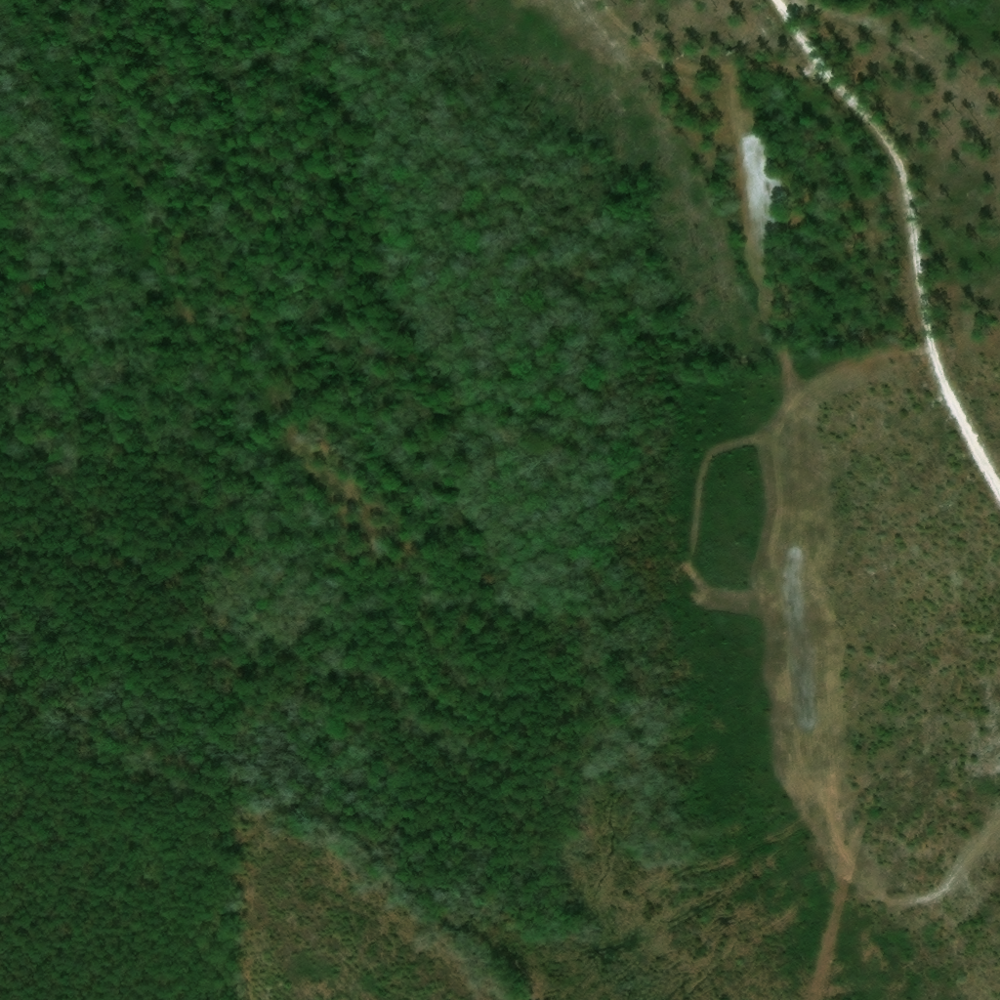

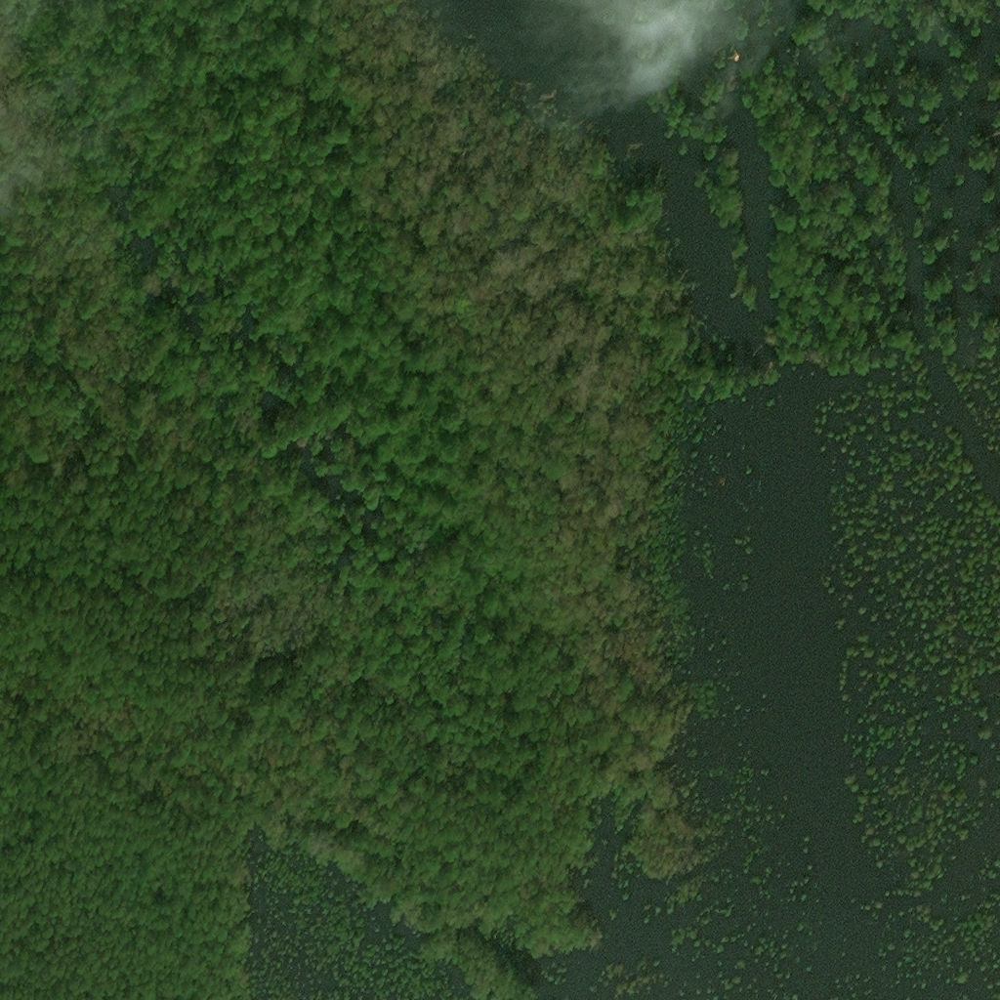

In [9]:
index = 137
from IPython.display import Image, display
print(convert_to_conversation(dataset_pairs[index], metadata_pairs[index]))

display(dataset_pairs[index][1]["image"])
display(dataset_pairs[index][0]["image"])

In [11]:


FastVisionModel.for_inference(model) # Enable for inference!

image_1 = dataset_pairs[index][1]["image"]
image_2 = dataset_pairs[index][0]["image"]
#instruction = "You are an expert satellite imagery analyst who can identify extent of damages after a dsiaster. You are provided with 2 images, first is pre disaster imagery and second one is post disater imagery of the same location. Describe accurately the extent of the damages."

messages = [
    {"role": "user", "content": [
        {"type": "image"},
        {"type": "image"},
        {"type": "text", "text": instruction}
    ]}
]
input_text = tokenizer.apply_chat_template(messages, add_generation_prompt = True)
print(input_text)
inputs = tokenizer(
    [image_1, image_2],
    input_text,
    add_special_tokens = False,
    return_tensors = "pt",
).to("cuda")



from transformers import TextStreamer
text_streamer = TextStreamer(tokenizer, skip_prompt = True)
_ = model.generate(**inputs, streamer = text_streamer, max_new_tokens = 512,
                   use_cache = True, temperature = 1.5, min_p = 0.1)

<|im_start|>user
<|vision_start|><|image_pad|><|vision_end|><|vision_start|><|image_pad|><|vision_end|>You are an expert satellite imagery analyst provided with pre and post disaster imageries. Describe accurately the extent of the damages.<|im_end|>
<|im_start|>assistant

Based on the provided satellite imagery, the analysis reveals a significant and widespread loss of forest cover in the second image, indicating a major destructive event such as a wildfire or deforestation. The changes are extensive and have occurred across large areas.

The key observations are:

- **Catastrophic Forest Loss**: There is a dramatic reduction in vegetation cover. In the first image, a dense, green forest dominates the landscape. In the second image, vast sections of this forest are now bare, brown, and charred earth, with only a few scattered, burnt-out trees remaining. The extent of this damage is immense, covering a significant portion of the area shown in the first image.

- **Transformation of Lan

In [38]:
from unsloth.trainer import UnslothVisionDataCollator
from trl import SFTTrainer, SFTConfig

FastVisionModel.for_training(model) # Enable for training!

trainer = SFTTrainer(
    model = model,
    tokenizer = tokenizer,
    data_collator = UnslothVisionDataCollator(model, tokenizer), # Must use!
    train_dataset = converted_dataset,
    args = SFTConfig(
        per_device_train_batch_size = 2,
        gradient_accumulation_steps = 4,
        warmup_steps = 5,
        #max_steps = 100,
        num_train_epochs = 1, # Set this instead of max_steps for full training runs
        learning_rate = 2e-4,
        logging_steps = 1,
        optim = "adamw_8bit",
        weight_decay = 0.001,
        lr_scheduler_type = "linear",
        seed = 3407,
        output_dir = "outputs",
        report_to = "none",     # For Weights and Biases

        # You MUST put the below items for vision finetuning:
        remove_unused_columns = False,
        dataset_text_field = "",
        dataset_kwargs = {"skip_prepare_dataset": True},
        max_length = 2048,
    ),
)

Unsloth: Model does not have a default image size - using 512


In [59]:
# @title Show current memory stats
gpu_stats = torch.cuda.get_device_properties(0)
start_gpu_memory = round(torch.cuda.max_memory_reserved() / 1024 / 1024 / 1024, 3)
max_memory = round(gpu_stats.total_memory / 1024 / 1024 / 1024, 3)
print(f"GPU = {gpu_stats.name}. Max memory = {max_memory} GB.")
print(f"{start_gpu_memory} GB of memory reserved.")

GPU = NVIDIA GB10. Max memory = 119.697 GB.
8.406 GB of memory reserved.


In [60]:
trainer_stats = trainer.train()

The model is already on multiple devices. Skipping the move to device specified in `args`.
==((====))==  Unsloth - 2x faster free finetuning | Num GPUs used = 1
   \\   /|    Num examples = 2,799 | Num Epochs = 1 | Total steps = 350
O^O/ \_/ \    Batch size per device = 2 | Gradient accumulation steps = 4
\        /    Data Parallel GPUs = 1 | Total batch size (2 x 4 x 1) = 8
 "-____-"     Trainable parameters = 51,346,944 of 8,818,470,640 (0.58% trained)


Unsloth: Will smartly offload gradients to save VRAM!


Step,Training Loss
1,0.013700
2,0.026100
3,0.005300
4,0.006700
5,0.028900
6,0.012200
7,0.012300
8,0.024000
9,0.006300
10,0.015100


In [61]:
# @title Show final memory and time stats
used_memory = round(torch.cuda.max_memory_reserved() / 1024 / 1024 / 1024, 3)
used_memory_for_lora = round(used_memory - start_gpu_memory, 3)
used_percentage = round(used_memory / max_memory * 100, 3)
lora_percentage = round(used_memory_for_lora / max_memory * 100, 3)
print(f"{trainer_stats.metrics['train_runtime']} seconds used for training.")
print(
    f"{round(trainer_stats.metrics['train_runtime']/60, 2)} minutes used for training."
)
print(f"Peak reserved memory = {used_memory} GB.")
print(f"Peak reserved memory for training = {used_memory_for_lora} GB.")
print(f"Peak reserved memory % of max memory = {used_percentage} %.")
print(f"Peak reserved memory for training % of max memory = {lora_percentage} %.")

2092.781 seconds used for training.
34.88 minutes used for training.
Peak reserved memory = 8.406 GB.
Peak reserved memory for training = 0.0 GB.
Peak reserved memory % of max memory = 7.023 %.
Peak reserved memory for training % of max memory = 0.0 %.


{'diaster_type': 'wind', 'damage_type': 'no-damage'}<|im_end|>
{'messages': [{'role': 'user', 'content': [{'type': 'text', 'text': 'You are an expert satellite imagery analyst provided with pre and post disaster imageries. Describe accurately the extent of the damages.'}, {'type': 'image', 'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1024x1024 at 0xED5C6A9D5910>}, {'type': 'image', 'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1024x1024 at 0xED5C6A9D5A00>}]}, {'role': 'assistant', 'content': [{'type': 'text', 'text': {'diaster_type': 'wind', 'damage_type': 'destroyed'}}]}]}


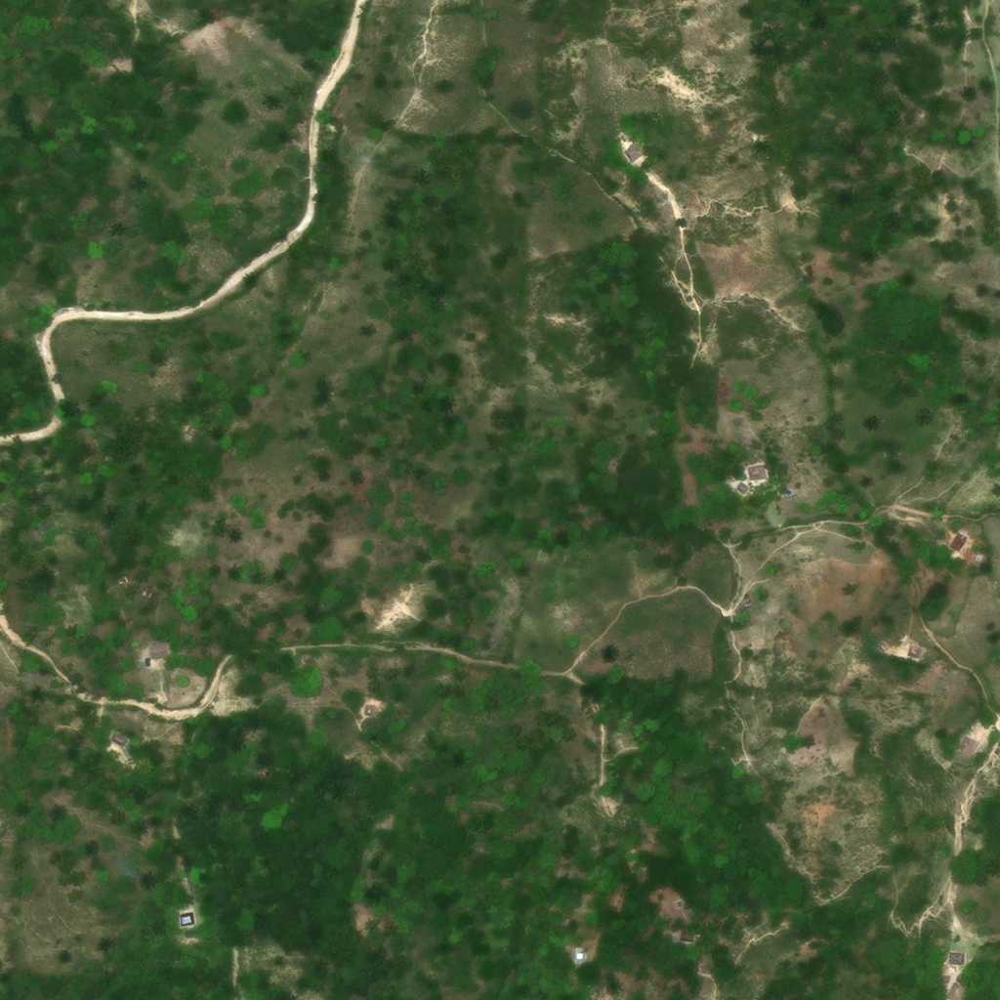

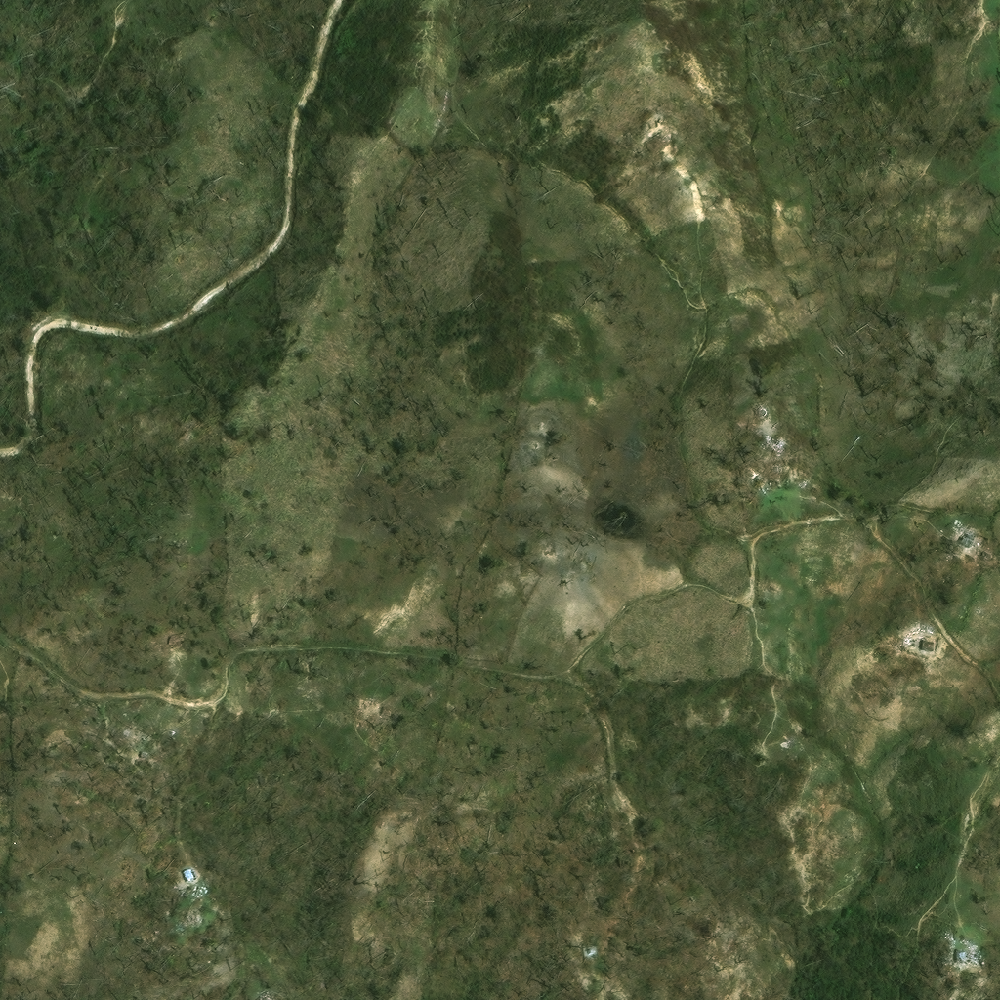

In [17]:
FastVisionModel.for_inference(model) # Enable for inference!
index = 777
image_1 = dataset_pairs[index][1]["image"]
image_2 = dataset_pairs[index][0]["image"]
#instruction = "You are an expert satellite imagery analyst. You are provided with 2 images for pre disaster imagery and post disater. Describe accurately the extent of the damages in json."

messages = [
    {"role": "user", "content": [
        {"type": "image"},
        {"type": "image"},
        {"type": "text", "text": instruction}
    ]}
]
input_text = tokenizer.apply_chat_template(messages, add_generation_prompt = True)
inputs = tokenizer(
    [image_1, image_2],
    input_text,
    add_special_tokens = False,
    return_tensors = "pt",
).to("cuda")

from transformers import TextStreamer
text_streamer = TextStreamer(tokenizer, skip_prompt = True)
_ = model.generate(**inputs, streamer = text_streamer, max_new_tokens = 128,
                   use_cache = True, temperature = 1.5, min_p = 0.1)
print(convert_to_conversation(dataset_pairs[index], metadata_pairs[index]))
display(image_1)
display(image_2)

In [18]:
metadata_test = load_dataset("data/test_images_labels_targets/test/labels", split='train')
datasets_test = load_dataset("data/test_images_labels_targets/test/images", split = 'train')

In [19]:
# Create pairs for dataset and metadata (non-overlapping).
test_dataset_pairs = non_overlapping_pairs(datasets_test)
test_metadata_pairs = non_overlapping_pairs(metadata_test)

# Quick sanity check
print('dataset_pairs:', len(test_dataset_pairs))
print('metadata_pairs:', len(test_metadata_pairs))

dataset_pairs: 933
metadata_pairs: 933


In [20]:
def get_ground_truth(dataset, metadata):
    disaster_type = metadata[0]['metadata']['disaster_type']
    return get_conversation_response(metadata[0]['features']['lng_lat'],metadata[0]['features']['lng_lat'], disaster_type)

ground_truth_data = [get_ground_truth(dataset, metadata) for (dataset, metadata) in zip(test_dataset_pairs, test_metadata_pairs)]
dis_type = [d['diaster_type']for d in ground_truth_data]
damage_type = [d['damage_type']for d in ground_truth_data]
print(len(damage_type))
print(len(dis_type))

933
933


In [62]:
import traceback
import re
from tqdm import tqdm
progress_bar = tqdm(total=len(test_dataset_pairs))

FastVisionModel.for_inference(model) # Enable for inference!
def get_llm_response(image_pairs, index):
    progress_bar.update(1)
    image_1 = image_pairs[index][1]["image"]
    image_2 = image_pairs[index][0]["image"]
    #instruction = "You are an expert satellite imagery analyst. You are provided with 2 images for pre disaster imagery and post disater. Describe accurately the extent of the damages in json."
    
    messages = [
        {"role": "user", "content": [
            {"type": "image"},
            {"type": "image"},
            {"type": "text", "text": instruction}
        ]}
    ]
    input_text = tokenizer.apply_chat_template(messages, add_generation_prompt = True)
    inputs = tokenizer(
        [image_1, image_2],
        input_text,
        add_special_tokens = False,
        return_tensors = "pt",
    ).to("cuda")

    # 4. Generate the output (non-streaming)
    outputs = model.generate(
        **inputs,
        max_new_tokens=128,
        use_cache=True,temperature = 1.5, min_p = 0.1, pad_token_id=tokenizer.eos_token_id,
    )[0]

    # 5. Decode and print the result
    #output_text = tokenizer.batch_decode(outputs, skip_special_tokens=True)
    #print(output_text[0])
    # 5. Extract only the assistant's response
    # Decode the entire output sequence and remove the original prompt part
    assistant_response = tokenizer.decode(outputs[inputs["input_ids"].shape[1]:], skip_special_tokens=True).strip()

    p = re.compile(r"(?<!\\)'") 
    valid_assistant_res = p.sub('"', assistant_response)
    #print(valid_assistant_res) 
    try:
        response_dict = json.loads(valid_assistant_res)
        return response_dict
        #print("Extracted Dictionary:", response_dict)
    except json.JSONDecodeError:
        #traceback.print_exc() 
        print("Failed to decode JSON. Raw output:", assistant_response)
    #from transformers import TextStreamer
    #text_streamer = TextStreamer(tokenizer, skip_prompt = True)
    #_ = model.generate(**inputs, streamer = text_streamer, max_new_tokens = 128,
     #                  use_cache = True, temperature = 1.5, min_p = 0.1)
llm_data = [get_llm_response(test_dataset_pairs, index) for index in range(len(test_dataset_pairs))]

100%|█████████████████████████████████████████| 933/933 [35:31<00:00,  2.23s/it]

In [63]:
dis_type_llm = [d['diaster_type']for d in llm_data]
damage_type_llm = [d['damage_type']for d in llm_data]
print(len(damage_type_llm))
print(len(dis_type_llm))

933
933


In [64]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    hamming_loss,
    classification_report,
    multilabel_confusion_matrix
)


In [65]:
accuracy_score(damage_type, damage_type_llm)

0.6463022508038585

In [66]:
report = classification_report(damage_type, damage_type_llm, output_dict=True)

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


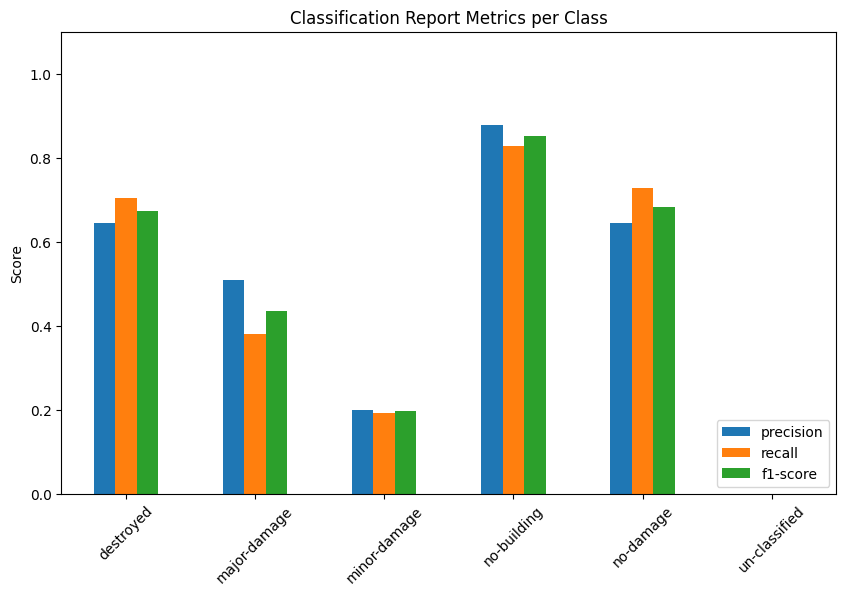

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
df_report = pd.DataFrame(report).transpose()

# Remove 'accuracy' row for the bar plot if desired
df_report = df_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# 3. Plot the DataFrame
df_report[['precision', 'recall', 'f1-score']].plot(kind='bar', figsize=(10, 6))
plt.title('Classification Report Metrics per Class')
plt.ylabel('Score')
plt.ylim(0, 1.1) # Limit y-axis to a reasonable range
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.show()

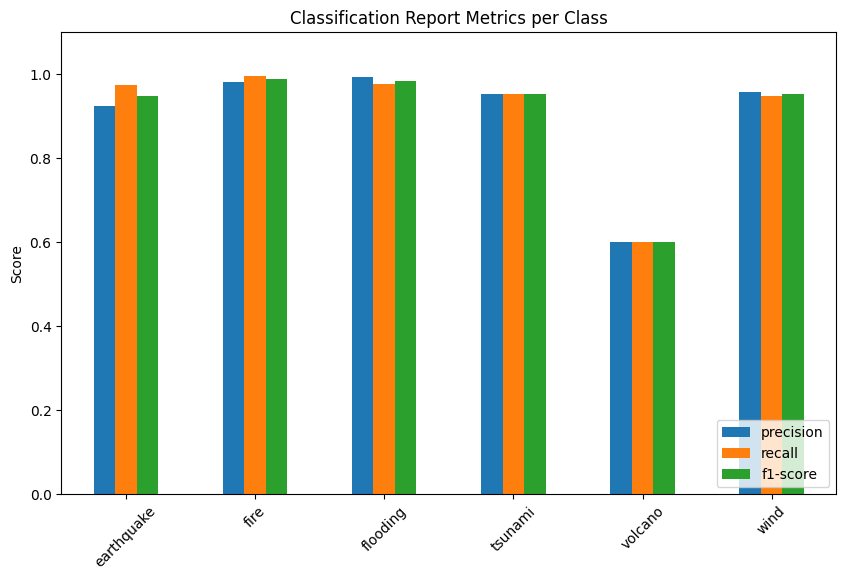

In [68]:
report2 = classification_report(dis_type, dis_type_llm, output_dict=True)
df_report = pd.DataFrame(report2).transpose()

# Remove 'accuracy' row for the bar plot if desired
df_report = df_report.drop(['accuracy', 'macro avg', 'weighted avg'])

# 3. Plot the DataFrame
df_report[['precision', 'recall', 'f1-score']].plot(kind='bar', figsize=(10, 6))
plt.title('Classification Report Metrics per Class')
plt.ylabel('Score')
plt.ylim(0, 1.1) # Limit y-axis to a reasonable range
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.show()

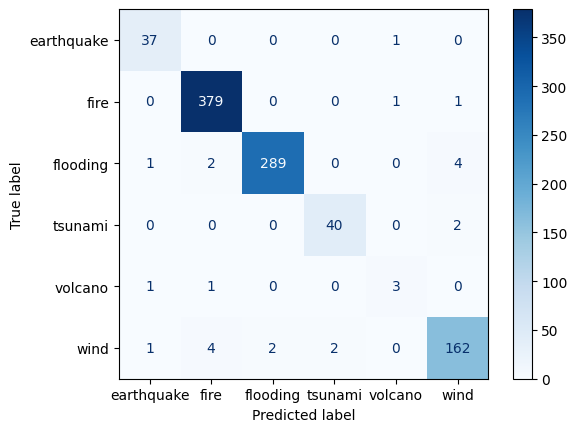

In [69]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
labels = np.unique(dis_type)
cm = confusion_matrix(dis_type, dis_type_llm, labels=labels) # Calculate the matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='Blues') # Plot as a heatmap
plt.show()

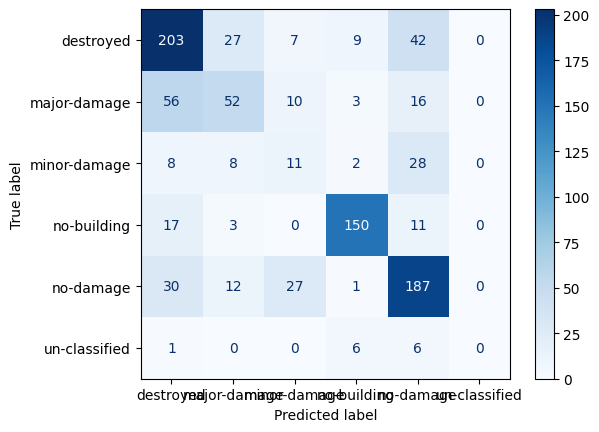

In [70]:
labels = np.unique(damage_type)
cm = confusion_matrix(damage_type, damage_type_llm, labels=labels) # Calculate the matrix

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='Blues') # Plot as a heatmap
plt.show()